In [1]:
import os
import sys

import tensorflow as tf
from tensorflow.keras import layers

import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

tf.random.set_seed(123)

In [2]:
df_1 = pd.read_csv(r'E:/Namespace/CALCU/nyu_data/data/nyu2_train.csv', names=['image', 'label'])
df_t = pd.read_csv(r'E:/Namespace/CALCU/nyu_data/data/nyu2_test.csv', names=['image', 'label'])

In [3]:
filelist = []

for files in df_1:
    data = {
        "image": [x for x in df_1['image']],
        "depth": [x for x in df_1['label']]
    }
for files in df_t:
    t_data = {
        "image": [x for x in df_1['image']],
        "depth": [x for x in df_1['label']]
    }
df = pd.DataFrame(data)
dft = pd.DataFrame(t_data)
df = df.sample(frac=1, random_state=42)
dft= dft.sample(frac=1, random_state=42)
df.head()

,image,depth
21273,data/nyu2_train/bedroom_0138_out/21.jpg,data/nyu2_train/bedroom_0138_out/21.png
14278,data/nyu2_train/bedroom_0080_out/11.jpg,data/nyu2_train/bedroom_0080_out/11.png
14303,data/nyu2_train/bedroom_0080_out/43.jpg,data/nyu2_train/bedroom_0080_out/43.png
16156,data/nyu2_train/dining_room_0010_out/21.jpg,data/nyu2_train/dining_room_0010_out/21.png
12899,data/nyu2_train/bedroom_0106_out/32.jpg,data/nyu2_train/bedroom_0106_out/32.png


Hyperparameters

In [4]:
HEIGHT = 416
WIDTH = 416
LR = 0.0002
EPOCHS = 30
BATCH_SIZE = 1
from skimage.color import rgb2gray

In [5]:
class DataGenerator(tf.keras.utils.Sequence):
    def  __init__(self, data, batch_size=6, dim=(416, 416), n_channels=3, shuffle=True):
        self.data = data
        self.indices = self.data.index.tolist()
        self.dim = dim
        self.n_channels = n_channels
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.min_depth = 0.1
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.data) / self.batch_size))

    def __getitem__(self, index):
        if (index + 1) * self.batch_size > len(self.indices):
            self.batch_size = len(self.indices) - index * self.batch_size
        # Generate one batch of data
        # Generate indices of the batch
        index = self.indices[index * self.batch_size : (index + 1) * self.batch_size]
        # Find list of IDs
        batch = [self.indices[k] for k in index]
        x, y = self.data_generation(batch)

        return x, y
    def on_epoch_end(self):

        """
        Updates indexes after each epoch
        """
        self.index = np.arange(len(self.indices))
        if self.shuffle == True:
            np.random.shuffle(self.index)
    def load(self, image_path, depth_map):
        """Load input and target image."""

        image_ = cv2.imread(os.path.join(r"E:/Namespace/CALCU/nyu_data/",image_path))
        image_ = cv2.resize(image_, self.dim)
        image_ = tf.image.convert_image_dtype(image_, tf.float32)

        depth_map = cv2.imread(os.path.join(r"E:/Namespace/CALCU/nyu_data/",depth_map),cv2.IMREAD_UNCHANGED)
        depth_map = cv2.resize(depth_map, self.dim)
        depth_map = np.expand_dims(depth_map, axis=2)
        depth_map = tf.image.convert_image_dtype(depth_map, tf.float32)

        return image_, depth_map
    def data_generation(self, batch):

        x = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size, *self.dim, 1))

        for i, batch_id in enumerate(batch):
            x[i,], y[i,] = self.load(
                self.data["image"][batch_id],
                self.data["depth"][batch_id],
            )

        return x, y

Visualization

C:\Users\msi\anaconda3\envs\yolov4-gpu\lib\site-packages\ipykernel_launcher.py:4: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("rainbow").copy()
  after removing the cwd from sys.path.


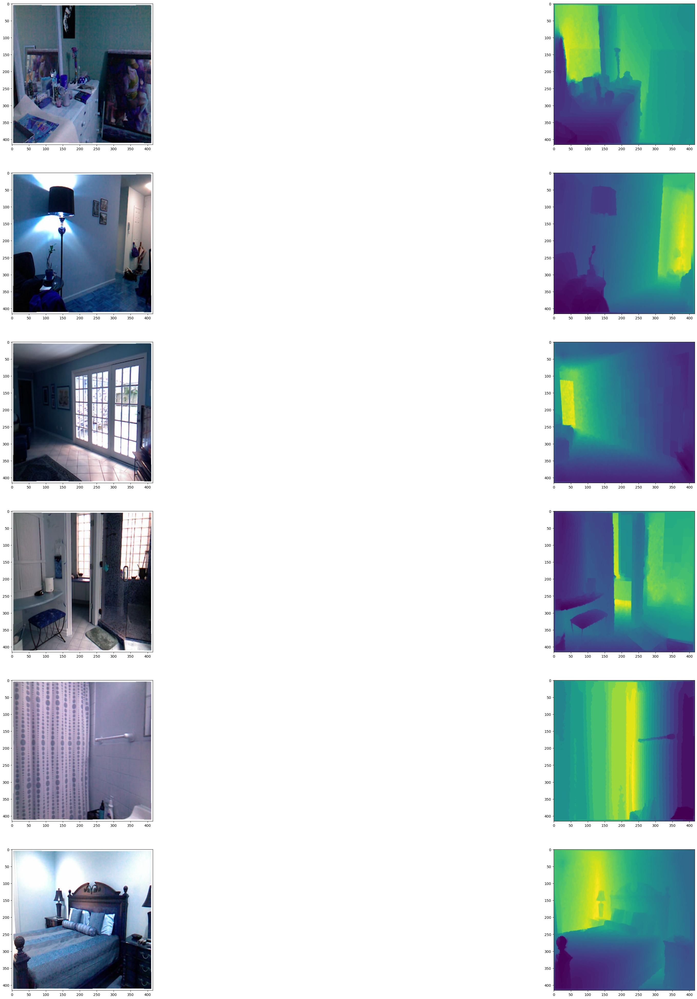

In [21]:
def visualize_depth_map(samples, test=False, model=None):
    input, target = samples
    cmap = plt.cm.rainbow
    cmap.set_bad(color="black")

    if test:
        pred = model.predict(input)
        fig, ax = plt.subplots(6, 3, figsize=(50, 50))
        print(pred)
        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()))
            ax[i, 2].imshow((pred[i].squeeze()))
        #return pred, target

    else:
        fig, ax = plt.subplots(6, 2, figsize=(50, 50))
        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()))
    

visualize_samples = next(
    iter(DataGenerator(data=df, batch_size=6, dim=(HEIGHT, WIDTH)))
)
visualize_depth_map(visualize_samples)

3D point cloud visualization

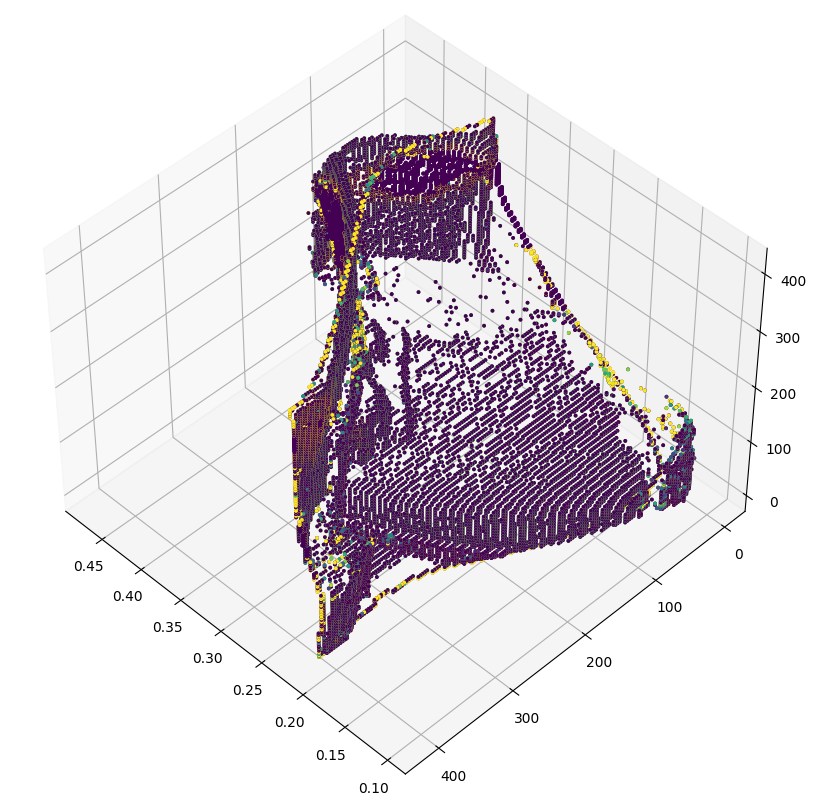

In [7]:
depth_vis = np.flipud(visualize_samples[1][5].squeeze())  # target
img_vis = np.flipud(visualize_samples[0][5].squeeze())  # input

fig = plt.figure(figsize=(15, 10))
ax = plt.axes(projection="3d")

STEP = 3
for x in range(0, img_vis.shape[0], STEP):
    for y in range(0, img_vis.shape[1], STEP):
        ax.scatter(
            [depth_vis[x, y]]*3,
            [y] * 3,
            [x] * 3,
            c=tuple(img_vis[x, y, :3] / 255),
            s=3,
            
        )
    ax.view_init(45, 135)

Depth-Estimation Model

In [8]:
class DownscaleBlock(layers.Layer):
    def __init__(
        self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs
    ):
        super().__init__(**kwargs)
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = layers.LeakyReLU(alpha=0.2)
        self.reluB = layers.LeakyReLU(alpha=0.2)
        self.bn2a = tf.keras.layers.BatchNormalization()
        self.bn2b = tf.keras.layers.BatchNormalization()

        self.pool = layers.MaxPool2D((2, 2), (2, 2))

    def call(self, input_tensor):
        d = self.convA(input_tensor)
        x = self.bn2a(d)
        x = self.reluA(x)

        x = self.convB(x)
        x = self.bn2b(x)
        x = self.reluB(x)

        x += d
        p = self.pool(x)
        return x, p


class UpscaleBlock(layers.Layer):
    def __init__(
        self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs
    ):
        super().__init__(**kwargs)
        self.us = layers.UpSampling2D((2, 2))
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = layers.LeakyReLU(alpha=0.2)
        self.reluB = layers.LeakyReLU(alpha=0.2)
        self.bn2a = tf.keras.layers.BatchNormalization()
        self.bn2b = tf.keras.layers.BatchNormalization()
        self.conc = layers.Concatenate()

    def call(self, x, skip):
        x = self.us(x)
        concat = self.conc([x, skip])
        x = self.convA(concat)
        x = self.bn2a(x)
        x = self.reluA(x)

        x = self.convB(x)
        x = self.bn2b(x)
        x = self.reluB(x)

        return x


class BottleNeckBlock(layers.Layer):
    def __init__(
        self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs
    ):
        super().__init__(**kwargs)
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = layers.LeakyReLU(alpha=0.2)
        self.reluB = layers.LeakyReLU(alpha=0.2)

    def call(self, x):
        x = self.convA(x)
        x = self.reluA(x)
        x = self.convB(x)
        x = self.reluB(x)
        return x

Loss

In [9]:
class DepthEstimationModel(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.ssim_loss_weight = 0.9
        self.l1_loss_weight = 0.1
        self.edge_loss_weight = 0.9
        self.loss_metric = tf.keras.metrics.Mean(name="loss")
        f = [16, 32, 64, 128, 256, 512]
        self.downscale_blocks = [
            DownscaleBlock(f[0]),
            DownscaleBlock(f[1]),
            DownscaleBlock(f[2]),
            DownscaleBlock(f[3]),
            DownscaleBlock(f[4]),
        ]
        self.bottle_neck_block = BottleNeckBlock(f[5])
        self.upscale_blocks = [
            UpscaleBlock(f[4]),
            UpscaleBlock(f[3]),
            UpscaleBlock(f[2]),
            UpscaleBlock(f[1]),
            UpscaleBlock(f[0]),
        ]
        self.conv_layer = layers.Conv2D(1, (1, 1), padding="same", activation="tanh")

    def calculate_loss(self, target, pred):
        # Edges
        dy_true, dx_true = tf.image.image_gradients(target)
        dy_pred, dx_pred = tf.image.image_gradients(pred)
        weights_x = tf.exp(tf.reduce_mean(tf.abs(dx_true)))
        weights_y = tf.exp(tf.reduce_mean(tf.abs(dy_true)))

        # Depth smoothness
        smoothness_x = dx_pred * weights_x
        smoothness_y = dy_pred * weights_y

        depth_smoothness_loss = tf.reduce_mean(abs(smoothness_x)) + tf.reduce_mean(
            abs(smoothness_y)
        )

        # Structural similarity (SSIM) index
        ssim_loss = tf.reduce_mean(
            1
            - tf.image.ssim(
                target, pred, max_val=WIDTH, filter_size=7, k1=0.01 ** 2, k2=0.03 ** 2
            )
        )
        # Point-wise depth
        l1_loss = tf.reduce_mean(tf.abs(target - pred))

        loss = (
            (self.ssim_loss_weight * ssim_loss)
            + (self.l1_loss_weight * l1_loss)
            + (self.edge_loss_weight * depth_smoothness_loss)
        )

        return loss

    @property
    def metrics(self):
        return [self.loss_metric]

    def train_step(self, batch_data):
        input, target = batch_data
        with tf.GradientTape() as tape:
            pred = self(input, training=True)
            loss = self.calculate_loss(target, pred)

        gradients = tape.gradient(loss, self.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))
        self.loss_metric.update_state(loss)
        return {
            "loss": self.loss_metric.result(),
        }

    def test_step(self, batch_data):
        input, target = batch_data

        pred = self(input, training=False)
        loss = self.calculate_loss(target, pred)

        self.loss_metric.update_state(loss)
        return {
            "loss": self.loss_metric.result(),
        }

    def call(self, x):
        c1, p1 = self.downscale_blocks[0](x)
        c2, p2 = self.downscale_blocks[1](p1)
        c3, p3 = self.downscale_blocks[2](p2)
        c4, p4 = self.downscale_blocks[3](p3)
        c5, p5 = self.downscale_blocks[4](p4)

        bn = self.bottle_neck_block(p5)
        
        u1 = self.upscale_blocks[0](bn, c5)
        u2 = self.upscale_blocks[1](u1, c4)
        u3 = self.upscale_blocks[2](u2, c3)
        u4 = self.upscale_blocks[3](u3, c2)
        u5 = self.upscale_blocks[4](u4, c1)

        return self.conv_layer(u5)

Training

In [11]:
optimizer = tf.keras.optimizers.Adam(
    learning_rate=LR,
    amsgrad=False,
)
model = DepthEstimationModel()
# Define the loss function
cross_entropy = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction="none"
)
# Compile the model
model.compile(optimizer, loss= cross_entropy)

train_loader = DataGenerator(
    data=df[:40000].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)
validation_loader = DataGenerator(
    data=df[40000:].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)
test_loader = DataGenerator(data=dft.reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH))

checkpoint_path = "weights/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

history = model.fit(
    train_loader,
    epochs=EPOCHS,
    validation_data=validation_loader,
    callbacks=[cp_callback]
)

Epoch 1/30
40000/40000 [==============================] - ETA: 0s - loss: 0.0574
Epoch 1: saving model to weights\cp.ckpt
40000/40000 [==============================] - 4310s 108ms/step - loss: 0.0574 - val_loss: 0.0575
Epoch 2/30
40000/40000 [==============================] - ETA: 0s - loss: 0.0290
Epoch 2: saving model to weights\cp.ckpt
40000/40000 [==============================] - 4017s 100ms/step - loss: 0.0290 - val_loss: 0.0525
Epoch 3/30
40000/40000 [==============================] - ETA: 0s - loss: 0.0203
Epoch 3: saving model to weights\cp.ckpt
40000/40000 [==============================] - 3995s 100ms/step - loss: 0.0203 - val_loss: 0.0493
Epoch 4/30
40000/40000 [==============================] - ETA: 0s - loss: 0.0159
Epoch 4: saving model to weights\cp.ckpt
40000/40000 [==============================] - 4028s 101ms/step - loss: 0.0159 - val_loss: 0.0492
Epoch 5/30
40000/40000 [==============================] - ETA: 0s - loss: 0.0134
Epoch 5: saving model to weights\cp.ckp

KeyboardInterrupt: 

Visualization

In [ ]:
test_loader = next(
    iter(
        DataGenerator(
            data=dft[60:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )
    )
)

visualize_depth_map(test_loader, test=True, model=model)
test_loader = next(
    iter(
        DataGenerator(
            data=dft[210:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )
    )
)

visualize_depth_map(test_loader, test=True, model=model)
test_loader = next(
    iter(
        DataGenerator(
            data=dft[300:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )
    )
)

visualize_depth_map(test_loader, test=True, model=model)

Model_performance

In [ ]:
def mse(imageA, imageB):
	# the 'Mean Squared Error' between the two images is the
	# sum of the squared difference between the two images;
	# NOTE: the two images must have the same dimension
	err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
	err /= float(imageA.shape[0] * imageA.shape[1])
	
	# return the MSE, the lower the error, the more "similar"
	# the two images are
	return err

input, target = test_loader
pred = model.predict(input)
for i in range(len(target)):
    rmse = np.sqrt(mse(pred[i],target[i]))
rmse

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

Save_Model

In [12]:
from tensorflow.keras.models import model_from_json
from tensorflow.keras import models
model.save("model_NYUv2_22", save_format="tf")
print("Saved model to disk")
 

INFO:tensorflow:Assets written to: model_NYUv2_22\assets


INFO:tensorflow:Assets written to: model_NYUv2_22\assets


Saved model to disk


In [ ]:
from tensorflow.keras.models import model_from_json
from tensorflow.keras import models
model.save('/input/private_model/model_2', save_format="tf")
print("Saved model to disk")
 

In [13]:
model.save_weights("model_NYUv2_22.h5")

In [ ]:
model.save_weights('./checkpoints/my_checkpoint')

In [17]:
new_model = tf.keras.models.load_model(r'Unet_NYUv2_Weights/model_NYUv2_22')

In [18]:
new_model.summary()

Model: "depth_estimation_model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 downscale_block_5 (Downscal  multiple                 2896      
 eBlock)                                                         
                                                                 
 downscale_block_6 (Downscal  multiple                 14144     
 eBlock)                                                         
                                                                 
 downscale_block_7 (Downscal  multiple                 55936     
 eBlock)                                                         
                                                                 
 downscale_block_8 (Downscal  multiple                 222464    
 eBlock)                                                         
                                                                 
 downscale_block_9 (Downscal  multiple    

In [ ]:
optimizer = tf.keras.optimizers.Adam(
    learning_rate=LR,
    amsgrad=False,
)
#new_model = DepthEstimationModel()
# Define the loss function
cross_entropy = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction="none"
)
# Compile the model
new_model.compile(optimizer, loss= cross_entropy)

train_loader = DataGenerator(
    data=df[:40000].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)
validation_loader = DataGenerator(
    data=df[40000:].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)
test_loader = DataGenerator(data=dft.reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH))
history = new_model.fit(
    train_loader,
    epochs=EPOCHS,
    validation_data=validation_loader,
)

1/1 [==============================] - 0s 43ms/step


C:\Users\msi\anaconda3\envs\yolov4-gpu\lib\site-packages\ipykernel_launcher.py:4: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("rainbow").copy()
  after removing the cwd from sys.path.


[[[[0.29636586]
   [0.30020916]
   [0.30698392]
   ...
   [0.3021484 ]
   [0.2977095 ]
   [0.28770632]]

  [[0.3084625 ]
   [0.3089266 ]
   [0.31153896]
   ...
   [0.30361247]
   [0.30216306]
   [0.29798037]]

  [[0.31610915]
   [0.31585836]
   [0.3154499 ]
   ...
   [0.30623773]
   [0.3060639 ]
   [0.30173162]]

  ...

  [[0.1815305 ]
   [0.14791015]
   [0.12268759]
   ...
   [0.26089102]
   [0.2628149 ]
   [0.26184443]]

  [[0.17927167]
   [0.14105725]
   [0.11746393]
   ...
   [0.2566633 ]
   [0.2574494 ]
   [0.25442073]]

  [[0.16207944]
   [0.14180359]
   [0.14539291]
   ...
   [0.24154982]
   [0.23542236]
   [0.22785051]]]


 [[[0.28144774]
   [0.28401908]
   [0.28923255]
   ...
   [0.3573523 ]
   [0.34519693]
   [0.33334306]]

  [[0.2915022 ]
   [0.29193372]
   [0.29370838]
   ...
   [0.36441714]
   [0.36187834]
   [0.35943377]]

  [[0.29746172]
   [0.29812863]
   [0.29773802]
   ...
   [0.3700052 ]
   [0.37152278]
   [0.36859894]]

  ...

  [[0.23896351]
   [0.21976906]
   [0.1

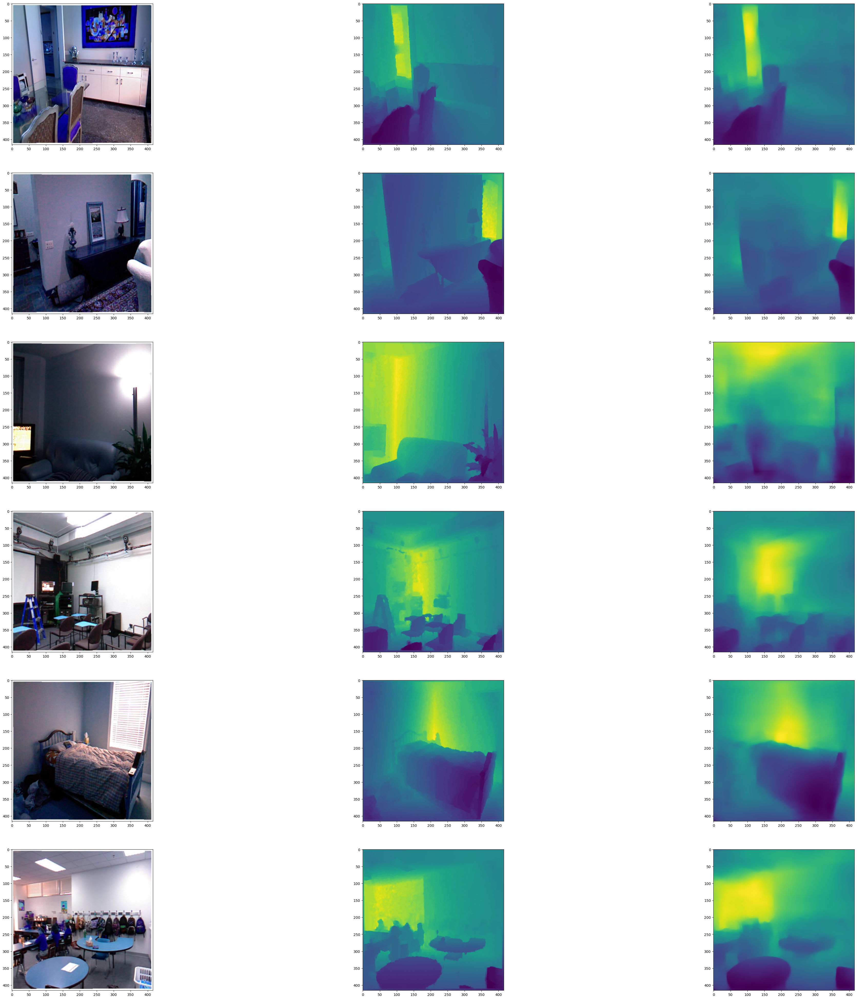

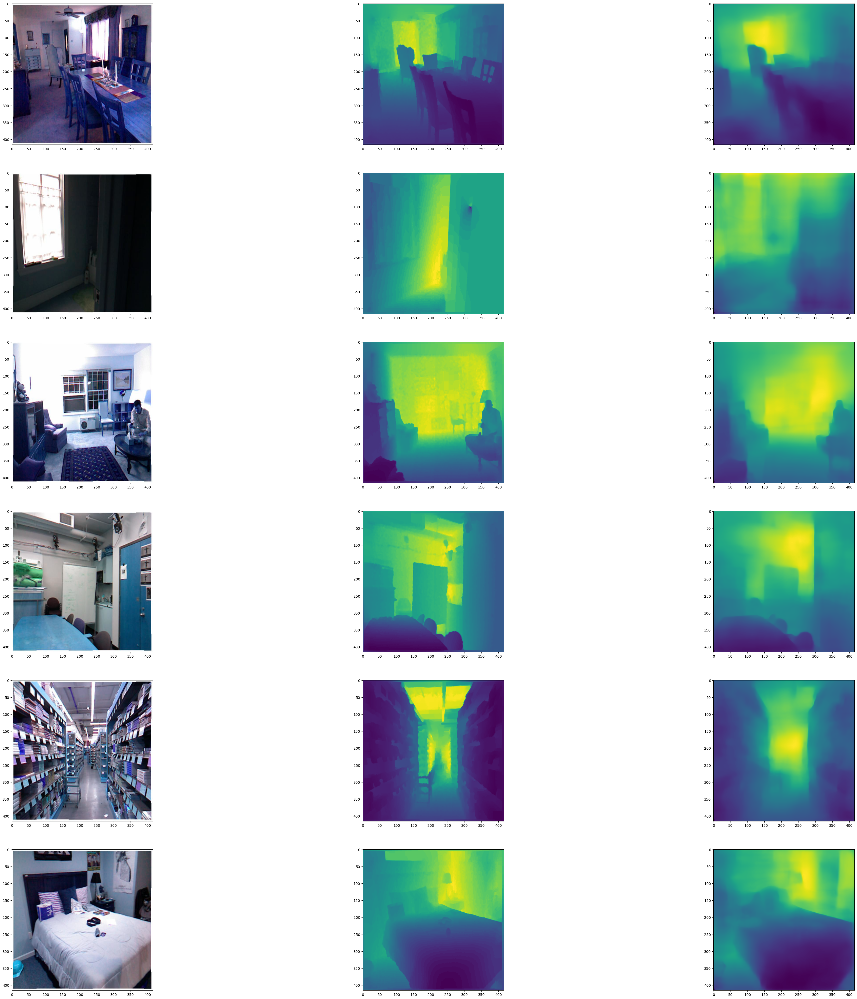

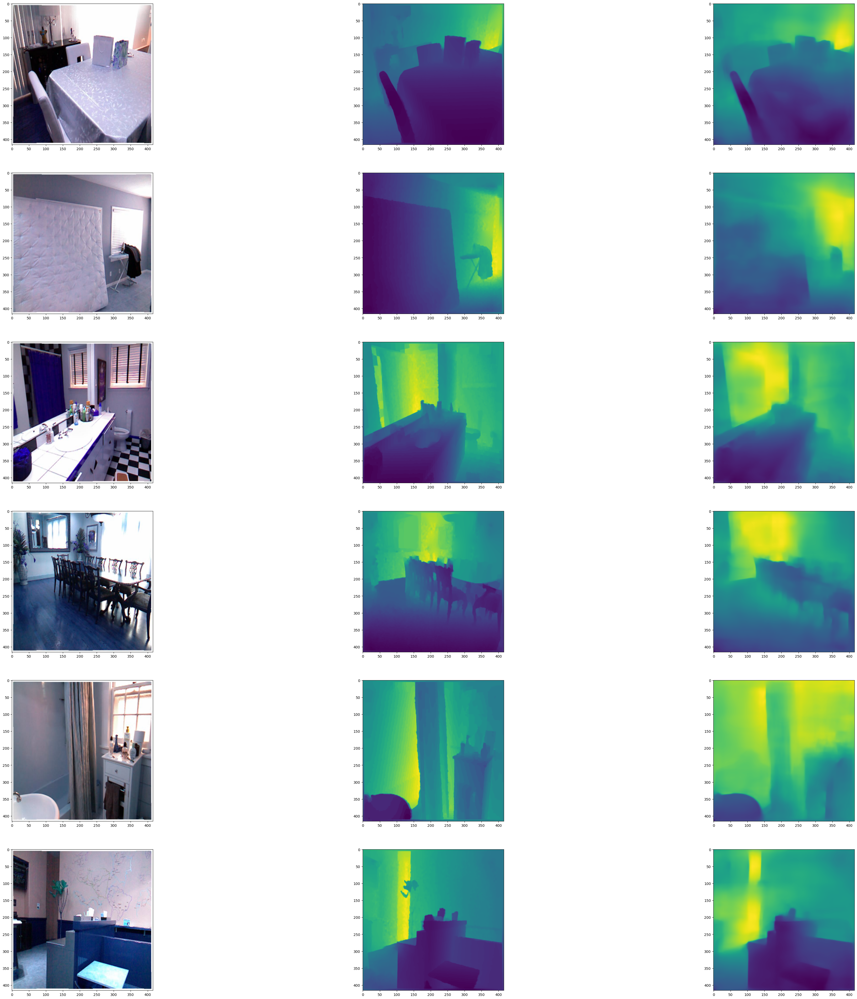

In [25]:
test_loader = next(
    iter(
        DataGenerator(
            data=dft[60:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )
    )
)

#out,  tar = visualize_depth_map(test_loader, test=True, model=new_model)

visualize_depth_map(test_loader, test=True, model=new_model)
test_loader = next(
    iter(
        DataGenerator(
            data=dft[210:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )
    )
)

visualize_depth_map(test_loader, test=True, model=new_model)
test_loader = next(
    iter(
        DataGenerator(
            data=dft[300:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )
    )
)

visualize_depth_map(test_loader, test=True, model=new_model)

In [20]:
out.shape, tar.shape

((6, 416, 416, 1), (6, 416, 416, 1))